In [18]:
!pip install dash

In [19]:
import numpy as np
import pandas as pd
import plotly.graph_objects as go
import plotly.express as px
import requests
import folium
import seaborn as sns
import matplotlib.pyplot as plt
import json
from folium.plugins import MarkerCluster
import geopandas as gpd
from folium import Choropleth
from dash import Dash, dcc, html, Input, Output, dash_table
url = "https://www.dropbox.com/scl/fi/66a75b2bww1v8skk15rft/2015_Street_Tree_Census_-_Tree_Data_20241207.csv?rlkey=1n6g0og9xl1cszlpggdl0ibpo&st=mghmm092&dl=1"
#https://data.cityofnewyork.us/Environment/2015-Street-Tree-Census-Tree-Data/uvpi-gqnh/about_data
# Load GeoJSON for Zipcode Boundaries
geojson_path = 'https://raw.githubusercontent.com/fedhere/PUI2015_EC/refs/heads/master/mam1612_EC/nyc-zip-code-tabulation-areas-polygons.geojson'

In [20]:
response = requests.get(url)
open('ny_trees.csv', 'wb').write(response.content)
df = pd.read_csv('ny_trees.csv')
df = df.sample(frac=0.01, random_state=42).reset_index(drop=True)
df

,tree_id,block_id,created_at,tree_dbh,stump_diam,curb_loc,status,health,spc_latin,spc_common,...,boro_ct,state,latitude,longitude,x_sp,y_sp,council district,census tract,bin,bbl
0,170569,339194,08/24/2015,5,0,OnCurb,Alive,Good,Pyrus calleryana,Callery pear,...,4101001,New York,40.598150,-73.747029,1.054501e+06,157300.0040,NaN,NaN,NaN,NaN
1,374591,207854,10/25/2015,11,0,OnCurb,Alive,Good,Fraxinus pennsylvanica,green ash,...,3035400,New York,40.579294,-73.972100,9.920000e+05,150330.1512,48.0,35602.0,3196580.0,3.072740e+09
2,114608,409042,08/03/2015,12,0,OnCurb,Alive,Good,Acer platanoides,Norway maple,...,5027702,New York,40.581752,-74.154811,9.412476e+05,151262.4800,51.0,27702.0,5090784.0,5.024520e+09
3,25523,227376,06/18/2015,19,0,OnCurb,Alive,Fair,Ulmus americana,American elm,...,3032100,New York,40.669807,-73.952908,9.973136e+05,183308.7702,35.0,321.0,3032894.0,3.012680e+09
4,286637,210353,10/06/2015,6,0,OnCurb,Alive,Fair,Prunus,cherry,...,3042200,New York,40.606759,-73.970522,9.924351e+05,160336.5327,44.0,422.0,3253610.0,3.066590e+09
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
6833,347496,205524,10/19/2015,20,0,OnCurb,Alive,Good,Platanus x acerifolia,London planetree,...,3041200,New York,40.605494,-73.973509,9.916059e+05,159875.4539,44.0,412.0,3177077.0,3.066560e+09
6834,161356,407090,08/20/2015,8,0,OnCurb,Alive,Good,Acer rubrum,red maple,...,5027301,New York,40.592453,-74.150783,9.423734e+05,155159.1533,50.0,27301.0,5119721.0,5.019948e+09
6835,558553,325013,05/13/2016,14,0,OnCurb,Alive,Good,Zelkova serrata,Japanese zelkova,...,4028800,New York,40.675414,-73.788167,1.043009e+06,185418.8336,28.0,288.0,4265373.0,4.122190e+09
6836,354720,514383,10/20/2015,23,0,OnCurb,Alive,Good,Quercus palustris,pin oak,...,2039600,New York,40.884254,-73.855790,1.024126e+06,261468.1228,12.0,396.0,2063777.0,2.048470e+09


In [21]:
print(df.shape)
print(df.columns)

(6838, 45)
Index(['tree_id', 'block_id', 'created_at', 'tree_dbh', 'stump_diam',
       'curb_loc', 'status', 'health', 'spc_latin', 'spc_common', 'steward',
       'guards', 'sidewalk', 'user_type', 'problems', 'root_stone',
       'root_grate', 'root_other', 'trunk_wire', 'trnk_light', 'trnk_other',
       'brch_light', 'brch_shoe', 'brch_other', 'address', 'postcode',
       'zip_city', 'community board', 'borocode', 'borough', 'cncldist',
       'st_assem', 'st_senate', 'nta', 'nta_name', 'boro_ct', 'state',
       'latitude', 'longitude', 'x_sp', 'y_sp', 'council district',
       'census tract', 'bin', 'bbl'],
      dtype='object')


In [22]:
print("Missing values before cleaning:")
print(df.isnull().sum())

Missing values before cleaning:
tree_id                0
block_id               0
created_at             0
tree_dbh               0
stump_diam             0
curb_loc               0
status                 0
health               329
spc_latin            330
spc_common           330
steward             5250
guards              6101
sidewalk             329
user_type              0
problems            4584
root_stone             0
root_grate             0
root_other             0
trunk_wire             0
trnk_light             0
trnk_other             0
brch_light             0
brch_shoe              0
brch_other             0
address                0
postcode               0
zip_city               0
community board        0
borocode               0
borough                0
cncldist               0
st_assem               0
st_senate              0
nta                    0
nta_name               0
boro_ct                0
state                  0
latitude               0
longitude         

In [23]:
df['spc_common'] = df['spc_common'].fillna('Unknown')
df['health'] = df['health'].fillna('Unknown')
df['curb_loc'] = df['curb_loc'].fillna('Unknown')

In [24]:
# Data Type Conversion
# Convert columns to appropriate data types
df['created_at'] = pd.to_datetime(df['created_at'], errors='coerce')
df['tree_dbh'] = pd.to_numeric(df['tree_dbh'], errors='coerce')
df['stump_diam'] = pd.to_numeric(df['stump_diam'], errors='coerce')
# Consistency in Categorical Data
# Standardize text columns
text_columns = ['health', 'status', 'spc_common', 'borough']
for col in text_columns:
    df[col] = df[col].str.lower().str.strip()
# Remove Outliers
# Remove outliers in tree_dbh using the IQR method
Q1 = df['tree_dbh'].quantile(0.25)
Q3 = df['tree_dbh'].quantile(0.75)
IQR = Q3 - Q1
df = df[(df['tree_dbh'] >= (Q1 - 1.5 * IQR)) & (df['tree_dbh'] <= (Q3 + 1.5 * IQR))]
# Drop unnecessary columns
columns_to_drop = ['x_sp', 'y_sp', 'bin', 'bbl', 'state', 'spc_latin', 'user_type', 'borocode', 'boro_ct', 'census tract','steward', 'guards', 'sidewalk', 'problems', 'council district']
df = df.drop(columns=columns_to_drop)
print("Missing values after cleaning:")
print(df.isnull().sum())

Missing values after cleaning:
tree_id            0
block_id           0
created_at         0
tree_dbh           0
stump_diam         0
curb_loc           0
status             0
health             0
spc_common         0
root_stone         0
root_grate         0
root_other         0
trunk_wire         0
trnk_light         0
trnk_other         0
brch_light         0
brch_shoe          0
brch_other         0
address            0
postcode           0
zip_city           0
community board    0
borough            0
cncldist           0
st_assem           0
st_senate          0
nta                0
nta_name           0
latitude           0
longitude          0
dtype: int64


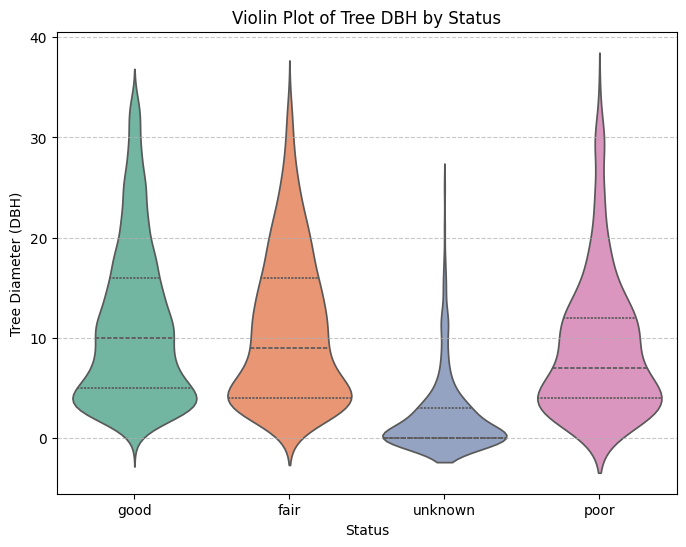

In [25]:
#2. Violin plot of the distribution of tree_dbh based on status
plt.figure(figsize=(8, 6))
#df_good = df[df['health'] == 'good']
sns.violinplot(x='health', y='tree_dbh', data=df, palette='Set2', inner='quartile', hue='health', dodge=False, legend=False)
plt.title('Violin Plot of Tree DBH by Status')
plt.xlabel('Status')
plt.ylabel('Tree Diameter (DBH)')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

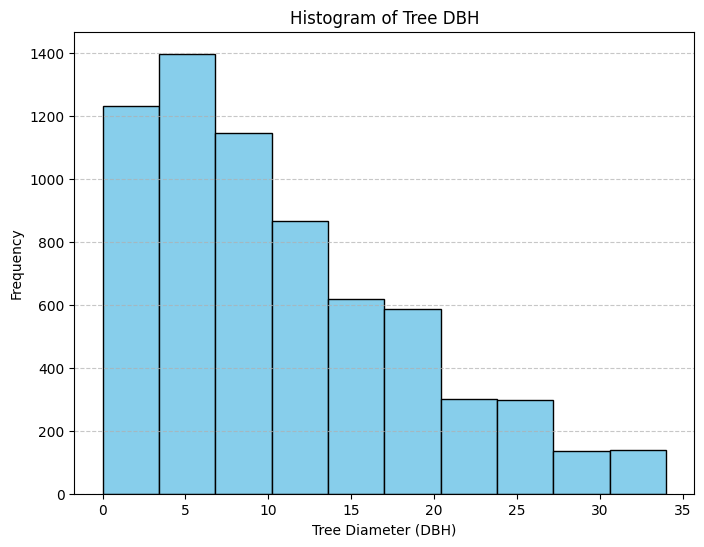

In [26]:
# 1. Histogram of tree_dbh
plt.figure(figsize=(8, 6))
plt.hist(df['tree_dbh'], bins=10, color='skyblue', edgecolor='black')
plt.title('Histogram of Tree DBH')
plt.xlabel('Tree Diameter (DBH)')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

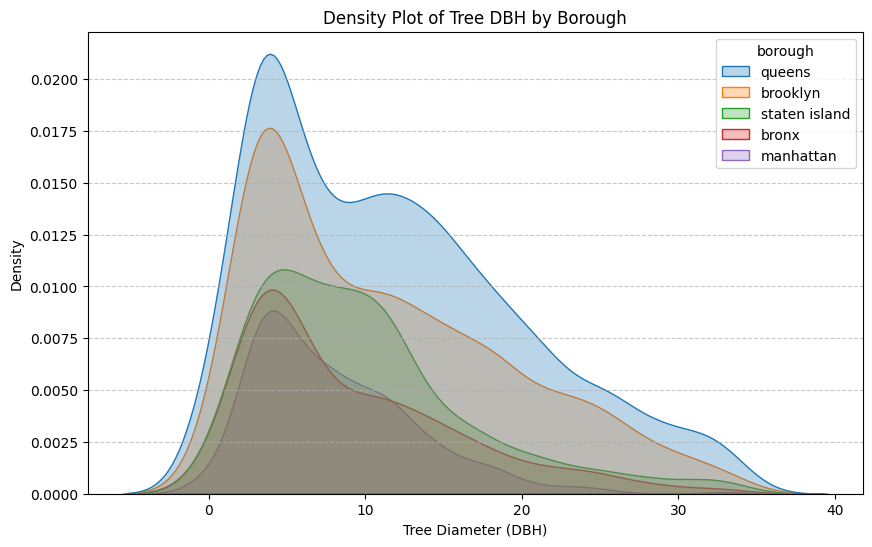

In [27]:
# 3. Grouped Density Plot: Tree Diameter by Borough
plt.figure(figsize=(10, 6))
sns.kdeplot(data=df, x='tree_dbh', hue='borough', fill=True, alpha=0.3, palette='tab10')
plt.title('Density Plot of Tree DBH by Borough')
plt.xlabel('Tree Diameter (DBH)')
plt.ylabel('Density')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

In [28]:
#code of choropleth map of tree density by zipcode using folium
df['postcode'] = pd.to_numeric(df['postcode'], errors='coerce')
tree_density = df.groupby('postcode').size().reset_index(name='tree_count')
latitude = df['latitude'].mean()
longitude = df['longitude'].mean()
m = folium.Map(location=[latitude, longitude], zoom_start=11)
Choropleth(
    geo_data=geojson_path,
    name='choropleth',
    data=tree_density,
    columns=['postcode', 'tree_count'],
    key_on='feature.properties.postalCode',
    fill_color='YlGn',
    fill_opacity=0.7,
    line_opacity=0.4,
    legend_name='Tree Density by Zipcode'
).add_to(m)
m

In [29]:
#bubble map having bubble size as tree dbh and color for health
df['health'].unique()
def health_to_color(health):
    color_map = {
        'good': 'green',
        'fair': 'orange',
        'poor': 'red'
    }
    return color_map.get(health, 'blue')
m = folium.Map(location=[df['latitude'].mean(), df['longitude'].mean()], zoom_start=12)
for _, row in df.iterrows():
    folium.CircleMarker(
        location=(row['latitude'], row['longitude']),
        radius=row['tree_dbh'] / 2,
        color=health_to_color(row['health']),
        fill=False,
        fill_color=health_to_color(row['health']),
        fill_opacity=0.7,
        popup=(
            f"<b>Tree DBH:</b> {row['tree_dbh']}<br>"
            f"<b>Health:</b> {row['health']}<br>"
            f"<b>Species:</b> {row['spc_common']}"
        )
    ).add_to(m)
m

In [30]:
# Initialize Dash app
app = Dash(__name__)

# Layout with Dash DataTable
app.layout = html.Div([
    html.H1("Tree Data Table", style={"textAlign": "center"}),
    dash_table.DataTable(
        id='tree-table',
        columns=[{"name": i, "id": i} for i in df.columns],
        data=df.to_dict('records'),
        style_table={'overflowX': 'auto', 'margin': 'auto'},
        style_cell={
            'textAlign': 'left',
            'padding': '10px',
            'fontFamily': 'Arial, sans-serif',
        },
        style_header={
            'backgroundColor': 'rgb(230, 230, 230)',
            'fontWeight': 'bold'
        },
        page_size=10,
        sort_action="native",
        filter_action="native",


    )
])

# Run the app
if __name__ == '__main__':
    app.run_server(debug=True)


<IPython.core.display.Javascript object>

In [31]:
# Initialize Dash app
app = Dash(__name__)
# Dash layout
app.layout = html.Div([
    html.H1("Tree Data Visualization", style={"textAlign": "center"}),

    # Dropdown for grouping options
    html.Label("Group By:", style={"fontSize": "18px"}),
    dcc.Dropdown(
        id='groupby-dropdown',
        options=[
            {'label': 'Borough', 'value': 'borough'},
            {'label': 'City (Zip City)', 'value': 'zip_city'}
        ],
        value='borough',  # Default grouping
        style={"width": "50%", "margin": "auto"}
    ),

    # Dropdown for plot type
    html.Label("Select Plot Type:", style={"fontSize": "18px"}),
    dcc.Dropdown(
        id='plot-dropdown',
        options=[
            {'label': 'Bar Plot', 'value': 'bar'},
            {'label': 'Scatter Plot', 'value': 'scatter'}
        ],
        value='bar',  # Default plot type
        style={"width": "50%", "margin": "auto"}
    ),

    # Graph container
    dcc.Graph(id='visualization-graph')
])

# Callback to update the graph based on dropdown selections
@app.callback(
    Output('visualization-graph', 'figure'),
    [Input('groupby-dropdown', 'value'),
     Input('plot-dropdown', 'value')]
)
def update_graph(group_by, plot_type):
    if plot_type == 'bar':
        # Aggregate data based on selected grouping
        agg_data = df.groupby(group_by, as_index=False)['tree_dbh'].mean()
        agg_data = agg_data.sort_values(by='tree_dbh', ascending=False)

        # Create a bar chart
        fig = px.bar(
            agg_data,
            x=group_by,
            y='tree_dbh',
            title=f'Average Tree Diameter by {group_by.capitalize()}',
            labels={'tree_dbh': 'Average Tree Diameter (DBH)', group_by: group_by.capitalize()},
            color=group_by,
            text='tree_dbh'
        )
        fig.update_traces(texttemplate='%{text:.2f}', textposition='outside')
        fig.update_layout(
            uniformtext_minsize=8,
            uniformtext_mode='hide',
            showlegend=False
        )

    elif plot_type == 'scatter':
        # Create a scatter plot
        fig = px.scatter(
            df,
            x='tree_dbh',
            y=group_by,
            color='health',
            size='tree_dbh',
            title=f'Scatter Plot of Tree DBH by {group_by.capitalize()}',
            labels={'tree_dbh': 'Tree Diameter (DBH)', group_by: group_by.capitalize()},
            hover_data=['health']
        )
        fig.update_layout(
            xaxis_title='Tree Diameter (DBH)',
            yaxis_title=group_by.capitalize(),
            showlegend=True
        )

    return fig

# Run Dash app
if __name__ == '__main__':
    app.run_server(debug=True)


<IPython.core.display.Javascript object>